# Data Exploration and Preprocessing

**Author:** Florian Klaver


In this Jupyter Notebook, the available satellite and ground truth data is explored and preprocessed.


---
## Setup

In [96]:
# Load necessary libraries
import glob
import os
from tqdm import tqdm
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import fiona
import pandas as pd
import numpy as np
import contextily as ctx
import rasterio
from rasterio.plot import show
from rasterio.vrt import WarpedVRT
from rasterio.features import rasterize
from rasterio.warp import calculate_default_transform, reproject, Resampling

# Folder for images for the report
docs_image_folder = "../docs/images/"
os.makedirs(docs_image_folder, exist_ok=True)

---
## Data Exploration

### Satellite Data 

In [97]:
# Satellite images (.tif files)
tif_files = glob.glob("../data/Sentinel_S2_2019-2023_with_CloudCOVER/Flughafen/*.tif", recursive=True)

print(f"{len(tif_files)} .tif-files found")

# Select an example tif file and get some info
example_tif = tif_files[100]

with rasterio.open(example_tif) as src:
    print("\nExample .tif file info:")
    print("Pixel size:", src.res)
    print(f"CRS: {src.crs}")
    print(f"Width: {src.width}, Height: {src.height}")
    print(f"Number of bands: {src.count}")
    # band names
    for i in range(1, src.count + 1):
        print(f"Band {i}: {src.descriptions[i-1]}")


201 .tif-files found

Example .tif file info:
Pixel size: (10.0, 10.0)
CRS: EPSG:32632
Width: 370, Height: 552
Number of bands: 13
Band 1: B2
Band 2: B3
Band 3: B4
Band 4: B5
Band 5: B6
Band 6: B7
Band 7: B8
Band 8: B8A
Band 9: B9
Band 10: B11
Band 11: B12
Band 12: binary
Band 13: probability


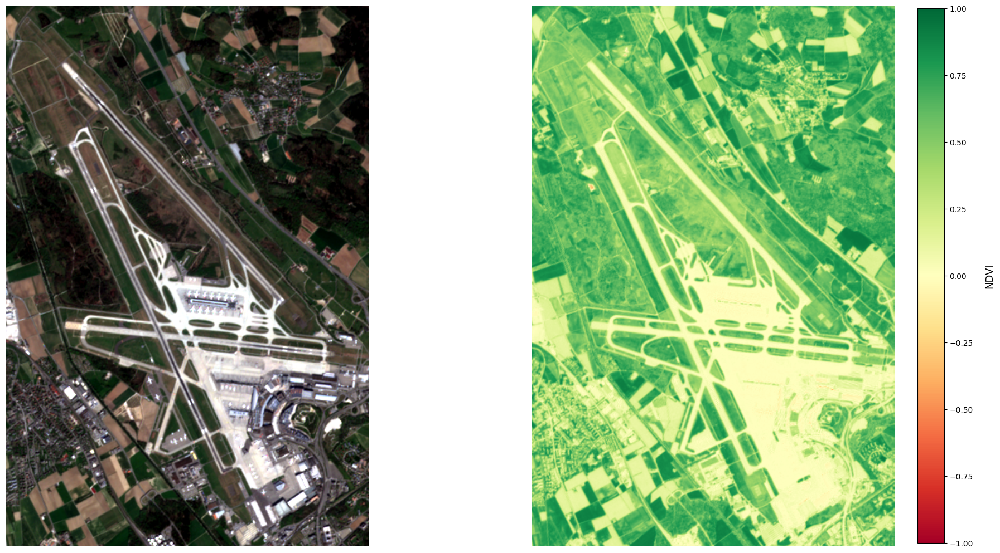

In [ ]:
# Visualize RGB composite and NDVI of example tif file

with rasterio.open(example_tif) as src:
    # Read RGB bands (Sentinel-2: Band 3=Red, 2=Green, 1=Blue)
    rgb = src.read([3, 2, 1]).astype(float)
    
    # Read NIR and Red for NDVI
    nir = src.read(7).astype(float)
    red = src.read(3).astype(float)
    
    # Calculate NDVI
    ndvi = np.where(
        (nir + red) == 0, 
        0, 
        (nir - red) / (nir + red)
    )

    # Normalize the RGB bands for better visualization
    def normalize(array):
        array_min, array_max = np.percentile(array, (2, 98))
        return np.clip((array - array_min) / (array_max - array_min), 0, 1)

    rgb_norm = np.stack([normalize(band) for band in rgb])

    # Plot both RGB and NDVI side by side
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    
    # RGB Composite
    show(rgb_norm, transform=src.transform, ax=axes[0])
    axes[0].axis("off")
    
    # NDVI
    ndvi_plot = axes[1].imshow(ndvi, cmap='RdYlGn', vmin=-1, vmax=1)
    #axes[1].set_title("NDVI (Normalized Difference Vegetation Index)", fontsize=12)
    axes[1].axis("off")
    
    # Add colorbar for NDVI
    cbar = plt.colorbar(ndvi_plot, ax=axes[1], fraction=0.046, pad=0.04)
    cbar.set_label('NDVI', rotation=90, labelpad=15, fontsize=13)
    cbar.ax.tick_params(labelsize=10)
    
    plt.tight_layout()
    plt.savefig(f"{docs_image_folder}sentinel_rgb_ndvi.png", dpi=300, bbox_inches='tight') # Save plot as image for report
    plt.show()

### Ground Truth Data

In [99]:
# Path to the .gpkg-file
gpkg_path = "../data/flughafen.gpkg"

# Show available layers
print("Available layers in the GeoPackage:")
print(fiona.listlayers(gpkg_path), "\n")

Available layers in the GeoPackage:
['schnittereignisse', 'flugplatz'] 



In [100]:
# Load both layers separately
gdf_events = gpd.read_file(gpkg_path, layer="schnittereignisse", engine= "fiona")
gdf_airfield = gpd.read_file(gpkg_path, layer="flugplatz")

# Display coordinate reference system (CRS)
print("Coordinate Reference System (CRS):")
print(gdf_events.crs)

Coordinate Reference System (CRS):
EPSG:2056


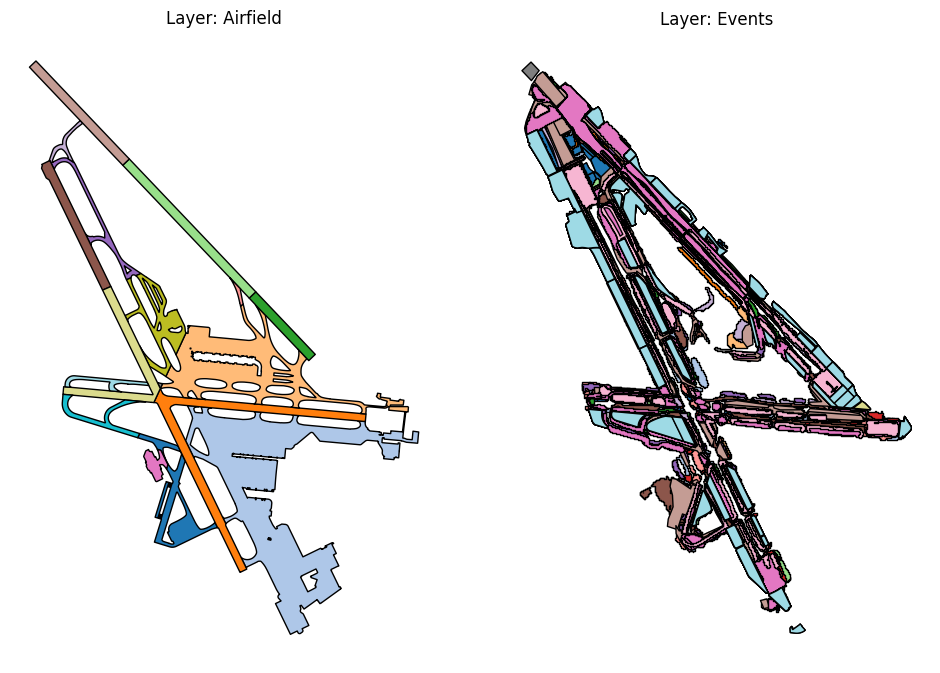

In [ ]:
# Plot both layers separately
fig, axes = plt.subplots(1, 2, figsize=(10, 15))

gdf_airfield.plot(ax=axes[0], cmap="tab20", edgecolor="black")
axes[0].set_title("Layer: Airfield")

gdf_events.plot(ax=axes[1], cmap="tab20", edgecolor="black")
axes[1].set_title("Layer: Events")

plt.tight_layout()
axes[0].axis('off')
axes[1].axis('off')
plt.show()

In [101]:
# Print basic information about the geodataframe
print("Basic information about the geodataframe:")
print(gdf_events.info(), "\n")
display(gdf_events.head())

# Check for missing values
print("\nMissing values in each column:")
print(gdf_events.isnull().sum())

Basic information about the geodataframe:
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1899 entries, 0 to 1898
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   gemaeht_Datum  1899 non-null   object  
 1   i              1899 non-null   int64   
 2   area           1899 non-null   float64 
 3   geometry       1899 non-null   geometry
dtypes: float64(1), geometry(1), int64(1), object(1)
memory usage: 59.5+ KB
None 



,gemaeht_Datum,i,area,geometry
0,2019-08-27,1,11765.001321,"POLYGON ((2682739.916 1259244.551, 2682800.562..."
1,2019-08-27,2,31364.569230,"POLYGON ((2682760.347 1259252.99, 2682706.202 ..."
2,2019-08-23,3,19766.706565,"POLYGON ((2682433.898 1259330.606, 2682451.721..."
3,2019-08-23,4,4516.523012,"POLYGON ((2682555.097 1259621.312, 2682447.448..."
4,2019-08-23,5,3638.996884,"POLYGON ((2682484.691 1259501.106, 2682590.569..."



Missing values in each column:
gemaeht_Datum    0
i                0
area             0
geometry         0
dtype: int64


In [ ]:
# Change "gemaeht_Datum" to "date" for easier handling
gdf_events = gdf_events.copy()
gdf_events = gdf_events.rename(columns={"gemaeht_Datum": "date"})

# Print number of events
print("Number of events:", len(gdf_events))

# Print first and last dates
print("First date:", gdf_events['date'].min())
print("Last date:", gdf_events['date'].max())

Number of events: 1899
First date: 2019-05-09
Last date: 2024-10-29


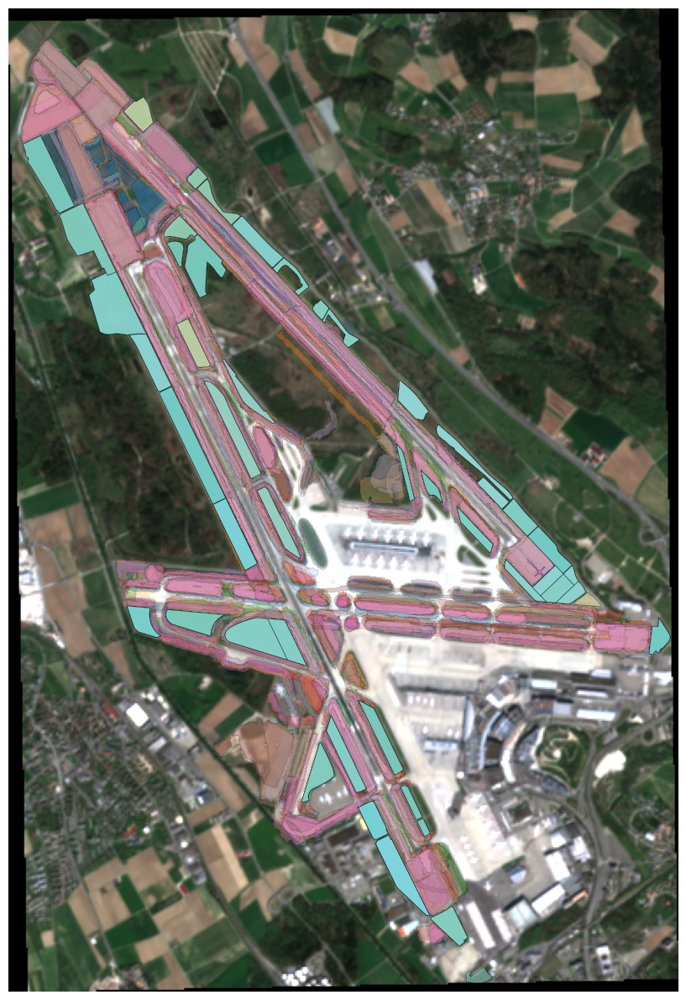

In [ ]:
# Plot all mowing events with satellite image background for report

# Open the raster and create a virtual reprojection to EPSG:2056
with rasterio.open(example_tif) as src:
    with WarpedVRT(src, crs='EPSG:2056', resampling=Resampling.bilinear) as vrt:
        
        # Read RGB bands (Sentinel-2: Band 3=Red, 2=Green, 1=Blue)
        rgb = vrt.read([3, 2, 1]).astype(float)
        
        # Helper function for normalization
        def normalize(array):
            array_min, array_max = np.percentile(array, (2, 98))
            return np.clip((array - array_min) / (array_max - array_min), 0, 1)

        # Normalize the RGB bands
        rgb_norm = np.stack([normalize(band) for band in rgb])

        # Plotting
        fig, ax = plt.subplots(figsize=(12, 12))

        # Show the normalized RGB image
        show(rgb_norm, transform=vrt.transform, ax=ax)

        # Overlay the Mowing Events 
        gdf_events.plot(
            ax=ax,
            cmap= 'tab20',    
            edgecolor="black",       
            linewidth=0.3,         
            alpha=0.3,             # High transparency to handle overlaps
            zorder=2,
            label='Mowing Events'
        )


        # Layout adjustments
        #ax.set_title("True Color (RGB) Satellite Image with Mowing Events Overlay", fontsize=14)
        ax.set_axis_off()

        plt.tight_layout()
        plt.savefig(f"{docs_image_folder}all_mowing_events.png", dpi=300, bbox_inches='tight')
        plt.show()

To show an example event clearer it is visualized here with a basemap. The basemap is used instead of an image from the Sentinel-2 data, because of the resolution. This basemap has a much higher resolution and therefore delivers a much clearer image.

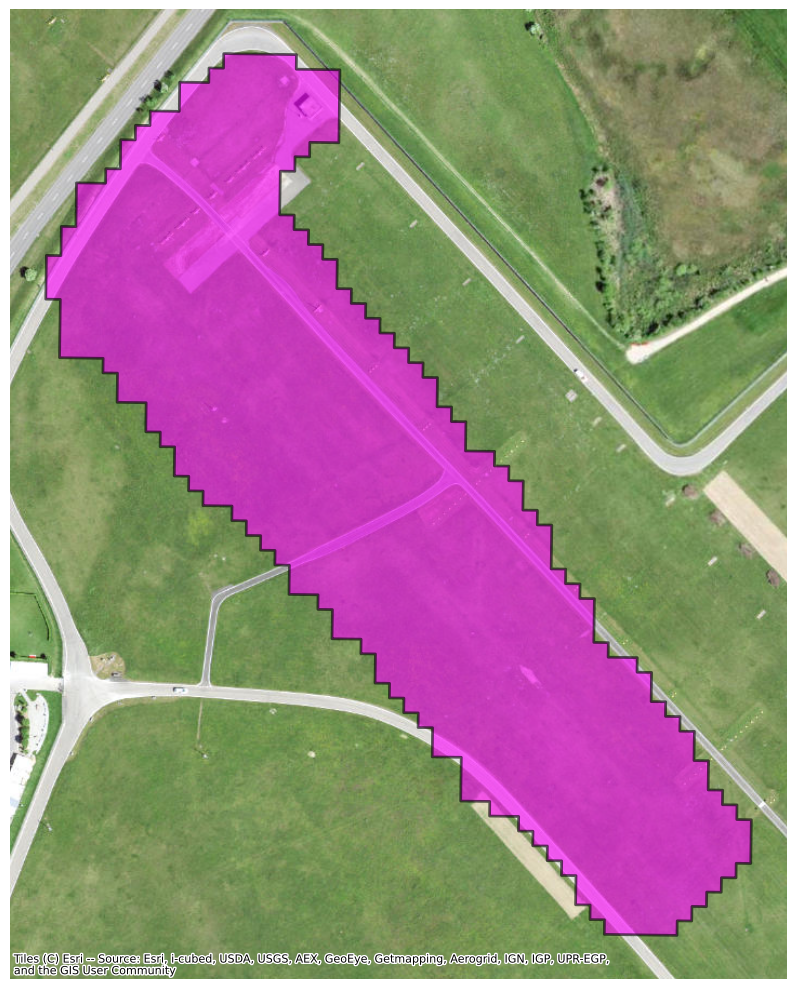

In [ ]:
# plot example event with basemap

some_event = gdf_events.iloc[[100]]

# Change CRS to Web Mercator for compatibility with basemaps
some_event_web = some_event.to_crs(epsg=3857)

# Visualize with basemap
fig, ax = plt.subplots(figsize=(10, 10))

some_event_web.plot(ax=ax, 
                     facecolor='magenta', 
                     edgecolor='black', 
                     alpha=0.6,
                     linewidth=2)

# Add basemap
ctx.add_basemap(ax, 
                source=ctx.providers.Esri.WorldImagery,
                zoom='auto')

#ax.set_title(f"Mowing event from {some_event['date'].values[0]}", fontsize=10)
ax.set_axis_off()
plt.tight_layout()
plt.savefig(f"{docs_image_folder}some_event_basemap.png", dpi=300, bbox_inches='tight')
plt.show()

Visualising the events both all together and single sample events more closely showed that some of them seem to have jagged borders (more like raster-format instead of real polygons) and are poorly alligned (e.g. overlapping streets and buildings).
It is therefore necessary to take a closer look into this issue before continuing.

In [106]:
# Check the ground truth data for problems
# Check Geometry Types
print("\n1. Geometry Types:")
print(gdf_events.geometry.type.value_counts())

# Check Validity
invalid = gdf_events[~gdf_events.geometry.is_valid]
print(f"\n2. Invalid Geometries: {len(invalid)}")
if len(invalid) > 0:
    print(f"   Indices: {invalid.index.tolist()}")

# Check Areas
gdf_events['computed_area'] = gdf_events.geometry.area
print("\n3. Areas (m²):")
print(f"   Min: {gdf_events['computed_area'].min():.2f}")
print(f"   Max: {gdf_events['computed_area'].max():.2f}")
print(f"   Median: {gdf_events['computed_area'].median():.2f}")

# Check Complexity (Number of Vertices)
gdf_events['n_vertices'] = gdf_events.geometry.apply(
    lambda geom: len(geom.exterior.coords) if geom.geom_type == 'Polygon' else 0
)
print("\n4. Complexity (Vertices per Polygon):")
print(f"   Min: {gdf_events['n_vertices'].min()}")
print(f"   Max: {gdf_events['n_vertices'].max()}")
print(f"   Median: {gdf_events['n_vertices'].median():.0f}")

# Many vertices = jagged / already rasterized?
too_complex = gdf_events[gdf_events['n_vertices'] > 100]
print(f"   Very complex (>100 Vertices): {len(too_complex)}")


1. Geometry Types:
Polygon         1889
MultiPolygon      10
Name: count, dtype: int64

2. Invalid Geometries: 0

3. Areas (m²):
   Min: 2002.56
   Max: 216462.91
   Median: 11891.04

4. Complexity (Vertices per Polygon):
   Min: 0
   Max: 2632
   Median: 100
   Very complex (>100 Vertices): 945


Looking further into this issue reveals that some of these polygons (the ones with many vertices) were probably vecorized from rasterdata, while the "nice" polygons were digitalized by hand from marked areas on papermaps. Overall, this means that the accuracy of the ground truth data is not 100% guaranteed. The complexity of the polygons (having many vertices) is not really a problem, since they will have to be rasterized anyways. But the accuracy (e.g. overlapping with streets or higher vegetation such as bushes) is a problem, since these areas can't be mowed. Therfore the "Bodenbedeckung" layer from the "Amtliche Vermessung" dataset from the geoportal Zurich will be used to filter out any areas in the ground truth polygons which don't belong to the "Acker, Wiese, Weide" category. This step will be done in the preprocessing section.

---
## Preprocessing

### Prepare Satellite Data
Sentinel-2 data and ground truth data are not in the same coordinate system (Grount Truth: EPSG:2056, Sentinel-2: EPSG:32632). To correctly allign the images and train an algorithm, they have to share the same CRS. Since EPSG:2056 is the swiss standard CRS, all Sentinel-2 .tif-files will be transformed into this coordinate system.

In [107]:
# Transform Sentinel-2 images CRS to swiss standard (EPSG:2056)

transformed_dir = '../data/Sentinel_CH/'
os.makedirs(transformed_dir, exist_ok=True)

target_crs = 'EPSG:2056'

print(f"Transforming {len(tif_files)} Sentinel-2 images to {target_crs}\n")

for idx, tif_file in enumerate(tif_files, 1):
    filename = os.path.basename(tif_file)
    output_path = os.path.join(transformed_dir, filename)
    
    # Skip if already exists
    if os.path.exists(output_path):
        print(f"[{idx}/{len(tif_files)}] {filename} - Already exists, skipping")
        continue
    
    with rasterio.open(tif_file) as src:
        # Calculate new transform and dimensions for target CRS
        transform, width, height = calculate_default_transform(
            src.crs, target_crs, src.width, src.height, *src.bounds
        )
        
        # Update metadata for new CRS
        kwargs = src.meta.copy()
        kwargs.update({
            'crs': target_crs,
            'transform': transform,
            'width': width,
            'height': height
        })
        
        # Reproject and save
        with rasterio.open(output_path, 'w', **kwargs) as dst:
            for band in range(1, src.count + 1):
                reproject(
                    source=rasterio.band(src, band),
                    destination=rasterio.band(dst, band),
                    src_transform=src.transform,
                    src_crs=src.crs,
                    dst_transform=transform,
                    dst_crs=target_crs,
                    resampling=Resampling.bilinear
                )
    
    print(f"[{idx}/{len(tif_files)}] {filename} - Transformed")

Transforming 201 Sentinel-2 images to EPSG:2056

[1/201] 2019-03-01.tif - Already exists, skipping
[2/201] 2019-03-03.tif - Already exists, skipping
[3/201] 2019-03-06.tif - Already exists, skipping
[4/201] 2019-03-08.tif - Already exists, skipping
[5/201] 2019-03-11.tif - Already exists, skipping
[6/201] 2019-03-13.tif - Already exists, skipping
[7/201] 2019-03-16.tif - Already exists, skipping
[8/201] 2019-03-18.tif - Already exists, skipping
[9/201] 2019-03-21.tif - Already exists, skipping
[10/201] 2019-03-23.tif - Already exists, skipping
[11/201] 2019-03-26.tif - Already exists, skipping
[12/201] 2019-03-28.tif - Already exists, skipping
[13/201] 2019-03-31.tif - Already exists, skipping
[14/201] 2019-04-02.tif - Already exists, skipping
[15/201] 2019-04-05.tif - Already exists, skipping
[16/201] 2019-04-07.tif - Already exists, skipping
[17/201] 2019-04-10.tif - Already exists, skipping
[18/201] 2019-04-12.tif - Already exists, skipping
[19/201] 2019-04-15.tif - Already exists, 

In [108]:
# Verify CRS match between transformed Sentinel-2 and ground truth
transformed_files = glob.glob(os.path.join(transformed_dir, '*.tif'))


with rasterio.open(transformed_files[0]) as src:
    sentinel_crs = src.crs

print("CRS Verification:")
print(f"  Ground truth (gdf_events): {gdf_events.crs}")
print(f"  Sentinel-2 (transformed):  {sentinel_crs}")

if gdf_events.crs == sentinel_crs:
    print("\nCRS match confirmed!")
else:
    print("\nCRS mismatch - check transformation!")


CRS Verification:
  Ground truth (gdf_events): EPSG:2056
  Sentinel-2 (transformed):  EPSG:2056

CRS match confirmed!


---
### Prepare Ground Truth Data

To correctly apply the ground truth data, it needs to be converted from vector to raster format. To optimise training, masks of the recorded mowing events for each date are created, ensuring these align in shape, bounds and pixel size with the Sentinel-2 data. Before conversion, the polygons are cleaned using an additional dataset: the official ground survey from Canton Zurich. This dataset classifies ground areas into several different categories. The ground truth polygons are then filtered by intersecting them with the relevant ground categories. 

#### Clean the Polygons

In [109]:
# Check the available layers in the official survey data
av_data_path = "../data/amtliche_vermessung_zh/DM01AVZH24LV95.gpkg"

print("Available layers in the GeoPackage:")
print(fiona.listlayers(av_data_path), "\n")

Available layers in the GeoPackage:
['FixpunkteKategorie1_LFP1Nachfuehrung', 'FixpunkteKategorie1_LFP1Nachfuehrung_Perimeter', 'FixpunkteKategorie1_LFP1', 'FixpunkteKategorie1_LFP1Pos', 'FixpunkteKategorie1_LFP1PosH_UeP2', 'FixpunkteKategorie1_LFP1PosH_UeP5', 'FixpunkteKategorie1_HFP1Nachfuehrung', 'FixpunkteKategorie1_HFP1Nachfuehrung_Perimeter', 'FixpunkteKategorie1_HFP1', 'FixpunkteKategorie1_HFP1Pos', 'FixpunkteKategorie2_LFP2Nachfuehrung', 'FixpunkteKategorie2_LFP2Nachfuehrung_Perimeter', 'FixpunkteKategorie2_LFP2', 'FixpunkteKategorie2_LFP2Pos', 'FixpunkteKategorie2_LFP2PosH_UeP2', 'FixpunkteKategorie2_LFP2PosH_UeP5', 'FixpunkteKategorie2_HFP2Nachfuehrung', 'FixpunkteKategorie2_HFP2Nachfuehrung_Perimeter', 'FixpunkteKategorie2_HFP2', 'FixpunkteKategorie2_HFP2Pos', 'FixpunkteKategorie3_LFP3Nachfuehrung', 'FixpunkteKategorie3_LFP3Nachfuehrung_Perimeter', 'FixpunkteKategorie3_LFP3', 'FixpunkteKategorie3_LFP3Pos', 'FixpunkteKategorie3_HilfsFPNachfuehrung', 'FixpunkteKategorie3_HilfsF

In [110]:
# Load the ground cover ("Bodenbedeckung_BoFlaeche_Geometrie") layer from the official survey data
# This layer has the necessary information for the cleaning
av_data = gpd.read_file(av_data_path, layer="Bodenbedeckung_BoFlaeche_Area")
print("Ground cover layer info:")
print(av_data.info(), "\n")
print("CRS:", av_data.crs, "\n")
display(av_data.head())

c:\Users\flori\anaconda3\envs\PA2\Lib\site-packages\pyogrio\raw.py:200: RuntimeWarning: GPKG: bad application_id=0x00000000 on '../data/amtliche_vermessung_zh/DM01AVZH24LV95.gpkg'
  return ogr_read(


Ground cover layer info:
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 10300 entries, 0 to 10299
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   OBJID          10300 non-null  object  
 1   Entstehung     10300 non-null  object  
 2   Qualitaet      10300 non-null  int64   
 3   Qualitaet_TXT  10300 non-null  object  
 4   Art            10300 non-null  int64   
 5   Art_TXT        10300 non-null  object  
 6   geometry       10300 non-null  geometry
dtypes: geometry(1), int64(2), object(4)
memory usage: 563.4+ KB
None 

CRS: EPSG:2056 



,OBJID,Entstehung,Qualitaet,Qualitaet_TXT,Art,Art_TXT,geometry
0,1851,1,0,AV93,21,humusiert.Acker_Wiese_Weide,"POLYGON ((2682981.101 1260249.123, 2682980.894..."
1,1850,153,0,AV93,21,humusiert.Acker_Wiese_Weide,"POLYGON ((2682978.457 1260260.137, 2682973.171..."
2,1849,1,0,AV93,10,befestigt.Strasse_Weg.Landwirtschaftsstrasse,"POLYGON ((2682973.177 1260250.494, 2682973.871..."
3,1848,1,0,AV93,35,bestockt.geschlossener_Wald,"POLYGON ((2682859.245 1260212.89, 2682858.662 ..."
4,2476,153,0,AV93,21,humusiert.Acker_Wiese_Weide,"POLYGON ((2682594.308 1260249.479, 2682594.191..."


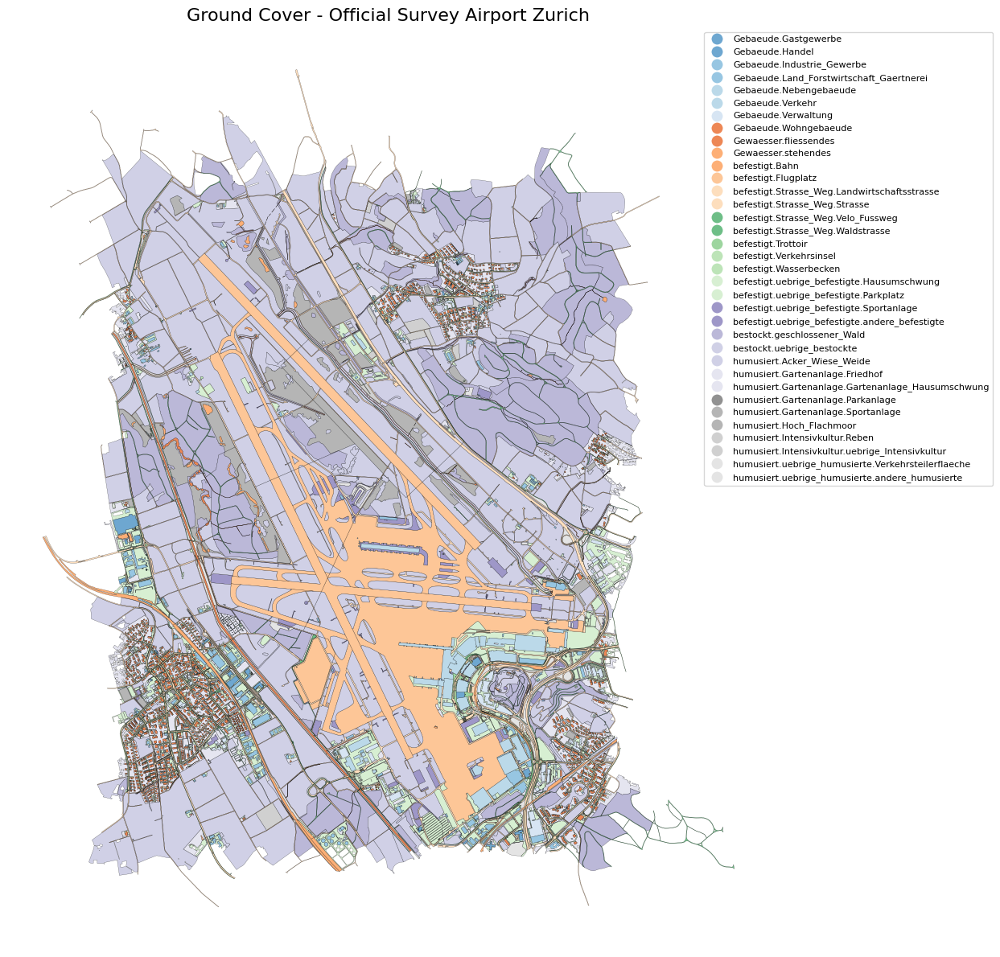


Number of areas per category:
Art_TXT
humusiert.Gartenanlage.Gartenanlage_Hausumschwung     1799
befestigt.uebrige_befestigte.Hausumschwung            1494
Gebaeude.Wohngebaeude                                 1490
humusiert.uebrige_humusierte.Verkehrsteilerflaeche     644
Gebaeude.Nebengebaeude                                 622
humusiert.Acker_Wiese_Weide                            577
befestigt.Strasse_Weg.Strasse                          426
befestigt.Verkehrsinsel                                335
befestigt.Trottoir                                     310
befestigt.Strasse_Weg.Landwirtschaftsstrasse           262
humusiert.uebrige_humusierte.andere_humusierte         243
bestockt.geschlossener_Wald                            232
Gebaeude.Industrie_Gewerbe                             214
befestigt.uebrige_befestigte.andere_befestigte         207
befestigt.uebrige_befestigte.Parkplatz                 187
Gewaesser.fliessendes                                  185
befestigt.Strasse

In [111]:
# Plot the ground cover data
fig, ax = plt.subplots(figsize=(12, 12))

av_data.plot(
    ax=ax,
    column='Art_TXT',        # colour by category
    categorical=True,        
    legend=True,
    legend_kwds={'bbox_to_anchor': (1.3, 1), 'fontsize': 8},
    cmap='tab20c',            
    edgecolor='black',
    linewidth=0.2,
    alpha=0.7
)

ax.set_title("Ground Cover - Official Survey Airport Zurich", fontsize=16)
ax.set_axis_off()

plt.tight_layout()
plt.show()

# Show number of areas per category
print("\nNumber of areas per category:")
print(av_data['Art_TXT'].value_counts())

In [112]:
# Check to verify ground truth data and ground cover share the same CRS
if gdf_events.crs == av_data.crs:
    print("CRS match confirmed.")

CRS match confirmed.


In [ ]:
# Define class to be used for cleaning
av_grass = av_data[av_data['Art_TXT'] == 'humusiert.Acker_Wiese_Weide'].copy()

In [ ]:
# Create Ids to identify same events if they are split up during cleaning
gdf_events['event_id'] = range(len(gdf_events)) 

gdf_events_cleaned = gdf_events.copy()

# Use intersection to clean ground truth data so polygons match only correct ground cover (grass areas)
gdf_events_cleaned = gpd.overlay(
    gdf_events_cleaned,
    av_grass[['geometry']],
    how='intersection',
    keep_geom_type=True
    )

print("Original number of events:", len(gdf_events))
print("Number of events after cleaning:", len(gdf_events_cleaned))

# Calculate area statistics before and after cleaning
area_before = gdf_events.geometry.area.sum()
area_after = gdf_events_cleaned.geometry.area.sum()
area_loss = area_before - area_after
area_loss_pct = (area_loss / area_before) * 100

print("Area statistics:")
print(f"  Before:  {area_before:,.0f} m²")
print(f"  After: {area_after:,.0f} m²")
print(f"  Removed: {area_loss:,.0f} m² ({area_loss_pct:.1f}%)")

Original number of events: 1899
Number of events after cleaning: 3791
Area statistics:
  Before:  33,660,532 m²
  After: 28,967,884 m²
  Removed: 4,692,648 m² (13.9%)


Very small areas don't add a lot of information and can even make the learning process more difficult for the model. Therefore very small ground truth areas will be removed. Additionally, since the resolution of sentinel-2 imagery is 10m it doesn't make sense to keep such small events.

In [115]:
# Filter: Remove too small fragments (< 400 m²)
MIN_AREA = 400  # m²

gdf_events_cleaned = gdf_events_cleaned[
    gdf_events_cleaned.geometry.area >= MIN_AREA
].copy()

print(f"After filtering (< {MIN_AREA} m²): {len(gdf_events_cleaned)} Events")


After filtering (< 400 m²): 3008 Events


In [116]:
# Take a look at the cleaned data
display(gdf_events_cleaned.head())

# Number of unique events after cleaning
print("Number of unique events after cleaning:", gdf_events_cleaned["event_id"].nunique())


,date,i,area,computed_area,n_vertices,event_id,geometry
0,2019-08-27,1,11765.001321,11765.001320,34,0,"MULTIPOLYGON (((2682785.944 1259144.736, 26827..."
1,2019-08-27,2,31364.569230,31364.569230,86,1,"POLYGON ((2682706.202 1259370.129, 2682712.43 ..."
2,2019-08-23,3,19766.706565,19766.706565,18,2,"POLYGON ((2682451.721 1259288.078, 2682433.836..."
3,2019-08-23,4,4516.523012,4516.523012,9,3,"POLYGON ((2682447.448 1259568.105, 2682433.939..."
4,2019-08-23,5,3638.996884,3638.996884,27,4,"POLYGON ((2682590.569 1259547.981, 2682602.463..."


Number of unique events after cleaning: 1860


The total number of events is now larger since some events from the original geopackage were split into multiple ones during the cleaning process. This makes sense since some of the original polygons crossed hard surfaces such as streets or buildings. From the check of the unique event ids it is visible that a total of 39 events were completly removed during the process (from 1899 to 1860).

In [117]:
# Safe cleaned data to new gpkg for data safety
output_dir = '../data/'

output_path = os.path.join(output_dir, 'mowing_events_cleaned.gpkg')
gdf_events_cleaned.to_file(output_path, driver='GPKG', layer='events_cleaned')

Event ID: 150
Before: 1 Polygon(s), 55855 m²
After: 4 Polygon(s), 44871 m²


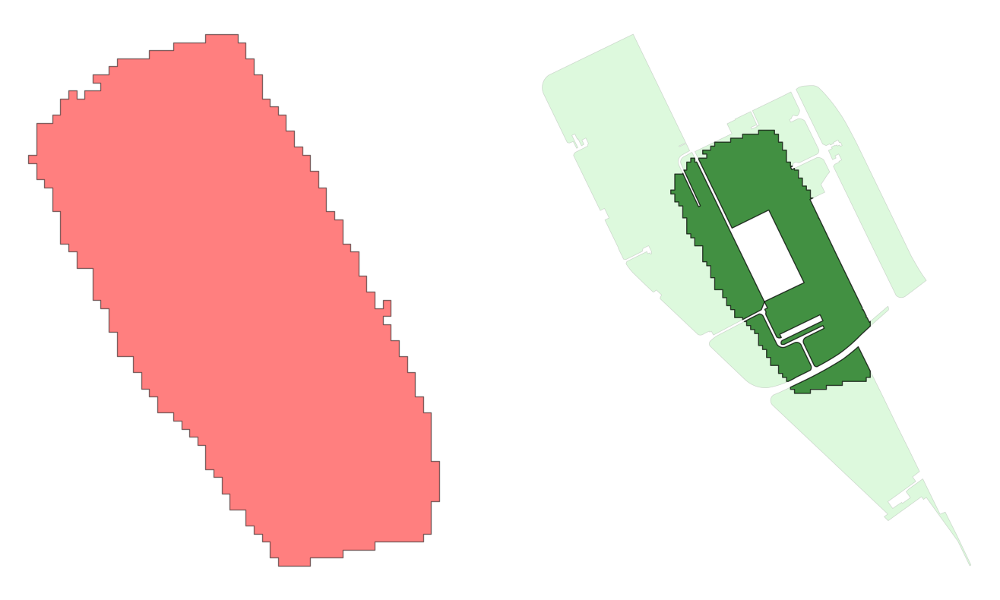

In [118]:
# Choose example event to compare
example_event_id = gdf_events.iloc[150]['event_id']

example_raw = gdf_events[gdf_events['event_id'] == example_event_id]
example_cleaned = gdf_events_cleaned[gdf_events_cleaned['event_id'] == example_event_id]

print(f"Event ID: {example_event_id}")
print(f"Before: {len(example_raw)} Polygon(s), {example_raw.geometry.area.sum():.0f} m²")
print(f"After: {len(example_cleaned)} Polygon(s), {example_cleaned.geometry.area.sum():.0f} m²")

if len(example_cleaned) > 0:
    fig, axes = plt.subplots(1, 2, figsize=(14, 8))

    # Before
    example_raw.plot(ax=axes[0], facecolor='red', edgecolor='black', alpha=0.5)
    #axes[0].set_title(f"BEFORE\nEvent ID: {example_event_id}\nArea: {example_raw.geometry.area.sum():.0f} m²", 
    #                  fontsize=14, fontweight='bold')
    axes[0].set_aspect('equal')
    
    # After
    gdf_gras_nearby = av_grass.cx[
        example_raw.total_bounds[0]:example_raw.total_bounds[2],
        example_raw.total_bounds[1]:example_raw.total_bounds[3]
    ]
    
    gdf_gras_nearby.plot(ax=axes[1], facecolor='lightgreen', edgecolor='gray', 
                         alpha=0.3, linewidth=0.5)
    example_cleaned.plot(ax=axes[1], facecolor='darkgreen', edgecolor='black', alpha=0.7)
    #axes[1].set_title(f"AFTER\nEvent ID: {example_event_id}\n{len(example_cleaned)} Fragment(s), {example_cleaned.geometry.area.sum():.0f} m²", 
    #                 fontsize=14, fontweight='bold')
    axes[1].set_aspect('equal')

    # No axis for better visualization
    axes[0].set_axis_off()
    axes[1].set_axis_off()
    
    plt.tight_layout()
    # Save plot as image for report
    plt.savefig(f"{docs_image_folder}event_cleaning.png", dpi=300, bbox_inches='tight')
    plt.show()


#### Create Ground Truth Masks

In [119]:
# Check if all sentinel-2 images share the same shape, bounds and pixel size
# This is important for the creation of the truth masks
tif_files_transformed = glob.glob(os.path.join(transformed_dir, '*.tif'))

with rasterio.open(tif_files_transformed[0]) as src:
    first_shape = src.shape
    first_bounds = src.bounds
    first_transform = src.transform

all_same = True
for tif_file in tif_files_transformed[1:]:
    with rasterio.open(tif_file) as src:
        if src.shape != first_shape or src.bounds != first_bounds or src.transform != first_transform:
            all_same = False
            break

if all_same:
    print("All transformed Sentinel-2 images share the same shape, bounds, and pixel size.")
else:
    print("Transformed Sentinel-2 images differ in shape, bounds, or pixel size.")


All transformed Sentinel-2 images share the same shape, bounds, and pixel size.


In [ ]:
# Since all converted sentinel-2 images share the exact same shape, bounds and pixelsize, the first image can be used as reference for rasterizing the ground truth data.

print("Reference parameters (from Sentinel-2):")
print(f"  Shape: {first_shape}")
print(f"  Bounds: {first_bounds}")
print(f"  Transform: {first_transform}\n")

Reference parameters (from Sentinel-2):
  Shape: (559, 381)
  Bounds: BoundingBox(left=2682012.930275509, bottom=1254788.2381722096, right=2685824.584985104, top=1260380.6659482294)
  Transform: | 10.00, 0.00, 2682012.93|
| 0.00,-10.00, 1260380.67|
| 0.00, 0.00, 1.00|



In [121]:
# Few final checks before the creation of the ground truth masks

gdf_events_cleaned['date'] = pd.to_datetime(gdf_events_cleaned['date'])
print(f"\nGround Truth Events: {len(gdf_events_cleaned)}")
print(f"Unique Dates: {gdf_events_cleaned['date'].nunique()}")
print(f"CRS: {gdf_events_cleaned.crs}")

# Sentinel-2 reference images
sentinel_CH_dir = '../data/Sentinel_CH/'
reference_sentinel = sorted(glob.glob(f'{sentinel_CH_dir}*.tif'))[0]

with rasterio.open(reference_sentinel) as src:
    ref_shape = (src.height, src.width)
    ref_transform = src.transform
    ref_crs = src.crs

print("\nSentinel-2 reference:")
print(f"  Shape: {ref_shape}")
print(f"  CRS: {ref_crs}")

# Check if CRS matches
if gdf_events_cleaned.crs == ref_crs:
    print("CRS match confirmed.")


Ground Truth Events: 3008
Unique Dates: 227
CRS: EPSG:2056

Sentinel-2 reference:
  Shape: (559, 381)
  CRS: EPSG:2056
CRS match confirmed.


In [122]:
# Create ground truth mask for each date (all events from the same date in one mask)

output_dir = '../data/ground_truth_masks/'
os.makedirs(output_dir, exist_ok=True)

dates = sorted(gdf_events_cleaned['date'].unique())

mask_info = []

for date in tqdm(dates, desc="Mask Creation"):
    events_at_date = gdf_events_cleaned[gdf_events_cleaned['date'] == date]
    
    # Rasterize the geometries
    shapes = [(geom, 1) for geom in events_at_date.geometry]
    
    mask = rasterize(
        shapes=shapes,
        out_shape=ref_shape,
        transform=ref_transform,
        fill=0,
        dtype='uint8',
        all_touched=False
    )

    # Save the mask
    date_str = date.strftime('%Y%m%d')
    output_path = os.path.join(output_dir, f'mask_{date_str}.tif')
    
    with rasterio.open(
        output_path, 'w',
        driver='GTiff',
        height=ref_shape[0],
        width=ref_shape[1],
        count=1,
        dtype='uint8',
        crs=ref_crs,
        transform=ref_transform,
        compress='lzw',
        nodata=255
    ) as dst:
        dst.write(mask, 1)
    
    # Stats
    mask_info.append({
        'date': date,
        'date_str': date_str,
        'filename': 'mask_' + date_str + '.tif',
        'n_events': len(events_at_date),
        'n_mowed_pixels': np.sum(mask == 1)
    })

Mask Creation: 100%|██████████| 227/227 [00:06<00:00, 36.66it/s]


In [123]:
# Summary
mask_df = pd.DataFrame(mask_info)
mask_df.to_csv(os.path.join(output_dir, 'masks_overview.csv'), index=False)


print(f"{len(dates)} masks created: {output_dir}")
print(f"Average {mask_df['n_mowed_pixels'].mean():,.0f} mowed pixels per mask")

227 masks created: ../data/ground_truth_masks/
Average 1,253 mowed pixels per mask


In [124]:
# Alignment check
first_mask = os.path.join(output_dir, f"mask_{mask_info[0]['date_str']}.tif")

with rasterio.open(first_mask) as m, rasterio.open(reference_sentinel) as s2:
    checks = {
        'Shape': m.shape == s2.shape,
        'CRS': m.crs == s2.crs,
        'Transform': m.transform == s2.transform
    }
    
    print("\nAlignment Check:")
    for check, ok in checks.items():
        print(f"  {'OK' if ok else 'NOT OK'} {check}")
    
    if all(checks.values()):
        print("\nAll Checks Passed!")


Alignment Check:
  OK Shape
  OK CRS
  OK Transform

All Checks Passed!


### Visualize Example Satellite Image with Ground Truth Mask

In [125]:
# Get all Sentinel-2 and mask files
sentinel_files = sorted(glob.glob(os.path.join(sentinel_CH_dir, '*.tif')))
mask_files = sorted(glob.glob(os.path.join(output_dir, 'mask_*.tif')))

# Extract dates from filenames
def extract_sentinel_date(filepath):
    """Extract date from Sentinel-2 filename: YYYY-MM-DD.tif"""
    filename = os.path.basename(filepath)
    date_str = filename.replace('.tif', '')
    return pd.to_datetime(date_str, format='%Y-%m-%d')

def extract_mask_date(filepath):
    """Extract date from mask filename: mask_YYYYMMDD.tif"""
    filename = os.path.basename(filepath)
    date_str = filename.replace('mask_', '').replace('.tif', '')
    return pd.to_datetime(date_str, format='%Y%m%d')

# Create dataframes with dates
sentinel_dates = pd.DataFrame({
    'filepath': sentinel_files,
    'date': [extract_sentinel_date(f) for f in sentinel_files]
})

mask_dates = pd.DataFrame({
    'filepath': mask_files,
    'date': [extract_mask_date(f) for f in mask_files]
})

# Choose a Ground Truth Mask by index
chosen_mask = mask_dates.iloc[180]

# Find closest Sentinel-2 image AFTER the mask date
future_sentinels = sentinel_dates[sentinel_dates['date'] >= chosen_mask['date']]

if not future_sentinels.empty:
    # Calculate time difference for future images only
    time_diffs = (future_sentinels['date'] - chosen_mask['date']).dt.total_seconds()
    closest_sentinel_idx = time_diffs.idxmin() # Get index of minimum diff
    chosen_sentinel = sentinel_dates.loc[closest_sentinel_idx]
    
    print(f"Selected Ground Truth Mask: {os.path.basename(chosen_mask['filepath'])}")
    print(f"  Date: {chosen_mask['date'].strftime('%Y-%m-%d')}")
    print(f"\nClosest Sentinel-2 Image (After): {os.path.basename(chosen_sentinel['filepath'])}")
    print(f"  Date: {chosen_sentinel['date'].strftime('%Y-%m-%d')}")
    print(f"  Time difference: {(chosen_sentinel['date'] - chosen_mask['date']).days} days")

    example_sentinel = chosen_sentinel['filepath']
    example_mask = chosen_mask['filepath']

Selected Ground Truth Mask: mask_20230907.tif
  Date: 2023-09-07

Closest Sentinel-2 Image (After): 2023-09-08.tif
  Date: 2023-09-08
  Time difference: 1 days


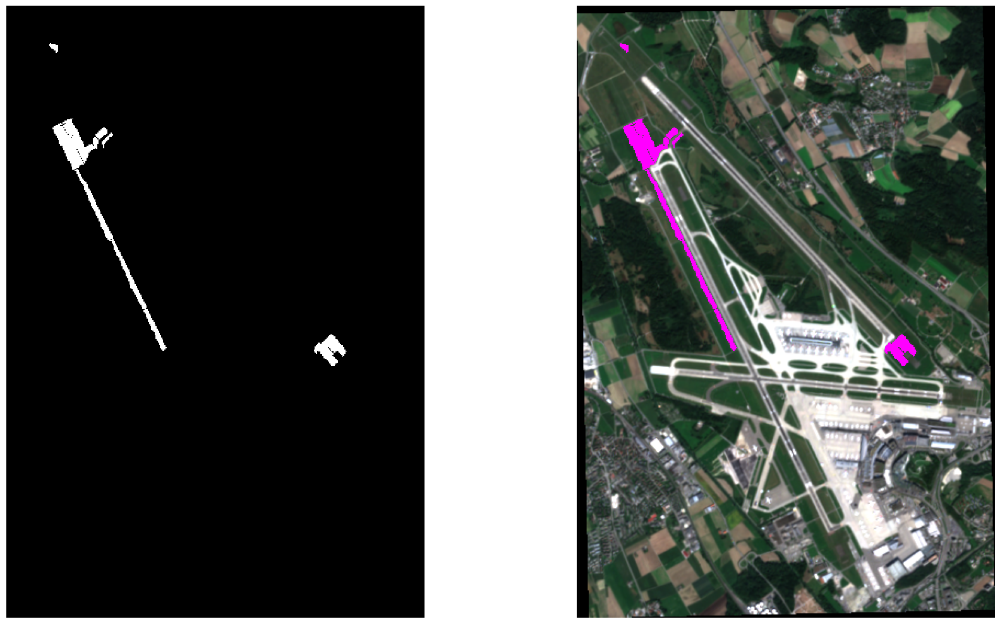


Mask Statistics:
  Total pixels: 212,979
  Mowed pixels: 2,188
  Mowed percentage: 1.03%


In [126]:
# Load example data
with rasterio.open(example_sentinel) as src:
    # RGB 
    rgb = src.read([3, 2, 1]).astype(float)
    
    # Normalize for visualization
    def normalize(array):
        array_min, array_max = np.percentile(array, (2, 98))
        return np.clip((array - array_min) / (array_max - array_min), 0, 1)
    
    rgb_norm = np.stack([normalize(band) for band in rgb])

with rasterio.open(example_mask) as src:
    mask = src.read(1)

# Plot
fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Ground Truth Mask
axes[0].imshow(mask, cmap='gray', interpolation='nearest', vmin=0, vmax=1)
#axes[0].set_title(f"Ground Truth Mask\n{os.path.basename(example_mask)}", fontsize=16)
axes[0].axis('off')

# Overlay
axes[1].imshow(np.transpose(rgb_norm, (1, 2, 0)))
mask_overlay = np.ma.masked_where(mask == 0, mask)
axes[1].imshow(mask_overlay, cmap=ListedColormap(['none', 'magenta']), alpha=1, vmin=0, interpolation='nearest')
#axes[1].set_title(f"Overlay: Sentinel-2 + Ground Truth\n{os.path.basename(example_sentinel)}", fontsize=16)
axes[1].axis('off')

plt.tight_layout()
# Save plot as image for report
plt.savefig(f"{docs_image_folder}sentinel_mask_overlay.png", dpi=300, bbox_inches='tight')
plt.show()

# Print mask statistics
print("\nMask Statistics:")
print(f"  Total pixels: {mask.size:,}")
print(f"  Mowed pixels: {np.sum(mask == 1):,}")
print(f"  Mowed percentage: {(np.sum(mask == 1) / mask.size * 100):.2f}%")

## Additional Visualizations for Report

### Exact Study Area
Only the Zurich airport area is of interest. In the Sentinel-2 satellite image data, also parts outside of this area are visible but these are not investigated. The fire brigade responsibility "Zuständigkeit Feuerwehr" data provided by the geoportal zurich is perfect to show this, since it contains an exact polygon of the Zurich Airport area as the airport has its own fire brigade.

In [127]:
# Check the available layers in the fire brigade resposibility responsibility gpkg
fb_data_path = "../data/amtliche_vermessung_zh/Feuerwehr_-OGD.gpkg"

print("Available layers in the GeoPackage:")
print(fiona.listlayers(fb_data_path), "\n")

Available layers in the GeoPackage:
['FW_GEMEINDEN_F', 'ADL_HRF_FW_P'] 



In [ ]:
# Load the polygons ("FW_GEMEINDE_F") with the responibility areas
# This layer has the necessary information
airport_data = gpd.read_file(fb_data_path, layer="FW_GEMEINDEN_F")
print("Ground cover layer info:")
print(airport_data.info(), "\n")
print("CRS:", airport_data.crs, "\n")
display(airport_data.head())

Ground cover layer info:
<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 6 entries, 0 to 5
Data columns (total 44 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   BFS                        6 non-null      int16         
 1   GEMEINDENAME               6 non-null      object        
 2   OBJECTID_1                 0 non-null      float64       
 3   GEMEINDENAME_1             6 non-null      object        
 4   ORTSFEUERWEHR              6 non-null      object        
 5   FEUERWEHR_BEMERKUNGEN      6 non-null      object        
 6   FW_ART_SYS                 6 non-null      object        
 7   STPKT_KERN_PRIO1           6 non-null      object        
 8   STPKT_KERN_PRIO2           6 non-null      object        
 9   ADL_HRF_PRIO1              6 non-null      object        
 10  ADL_HRF_PRIO2              6 non-null      object        
 11  ADL_HRF_BEMERKUNGEN        6 non-null     

,BFS,GEMEINDENAME,OBJECTID_1,GEMEINDENAME_1,ORTSFEUERWEHR,FEUERWEHR_BEMERKUNGEN,FW_ART_SYS,STPKT_KERN_PRIO1,STPKT_KERN_PRIO2,ADL_HRF_PRIO1,...,ZUSAMMENARBEIT_SPEZ1,ZUSAMMENARBEIT_SPEZ2,FRF,KORRESPONDENZ_ADRESSE,KORRESPONDENZ_EMAIL,KORRESPONDENZ_URL,ORGANIZATION_ID,SHAPE.AREA,SHAPE.LEN,geometry
0,92,Oberglatt,NaN,,Feuerwehr Oberglatt,Zusammenarbeitsvertrag Oberglatt - Rümlang,Milizfeuerwehr,Stützpunktfeuerwehr Dielsdorf,Situativ nach Beurteilung ELZ,ADL Rümlang,...,keine,keine,Keine,Bülachstrasse 17b 8154 Oberglatt (ZH),info@fwoberglatt.ch,,ae3018eb-c6e5-45df-bd68-502840fbed12,6.378978e+06,18452.485468,"POLYGON ((2682971.604 1260232.617, 2683110.607..."
1,9999,Flughafen Zürich,NaN,,Schutz und Rettung Zürich,Schutz und Rettung Zürich,Berufsfeuerwehr,Stützpunktfeuerwehr Zürich,Situativ nach Beurteilung ELZ,ADL Schutz und Rettung Zürich,...,keine,keine,Keine,Weststrasse 4 8036 Zürich,,,1018c462-e534-41e3-9b07-a21c4c7a97b5,8.163259e+06,16952.921772,"POLYGON ((2683456.313 1256012.795, 2683369.176..."
2,72,Winkel,NaN,,Feuerwehr Bachenbülach - Winkel,Zweckverband Bachenbülach - Winkel,Milizfeuerwehr,Stützpunktfeuerwehr Bülach,Situativ nach Beurteilung ELZ,ADL Bülach,...,keine,keine,Keine,Postfach 35 8185 Winkel,gma@fwbawi.ch,,38d48d37-66e2-419c-b7ce-931008be43a4,7.610187e+06,17695.732427,"POLYGON ((2685264.052 1262710.823, 2685278.802..."
3,97,Rümlang,NaN,,Feuerwehr Rümlang,Zusammenarbeitsvertrag Oberglatt - Rümlang,Milizfeuerwehr,Stützpunktfeuerwehr Opfikon,Situativ nach Beurteilung ELZ,ADL Rümlang,...,keine,keine,Keine,Oberdorfstrasse 5 8153 Rümlang,stabsoffizier@fwruemlang.ch,,e31adffd-7b69-42b1-ae8b-e7588de6442c,1.121091e+07,18924.957519,"POLYGON ((2684180.347 1255003.851, 2684153.424..."
4,62,Kloten,NaN,,Feuerwehr Kloten,Stützpunktfeuerwehr,Milizfeuerwehr,Stützpunktfeuerwehr Kloten,Situativ nach Beurteilung ELZ,ADL Kloten,...,keine,keine,Keine,,,,117d367c-29ab-471c-8925-2dde59d02586,1.461243e+07,27361.385908,"MULTIPOLYGON (((2684506.195 1255116.986, 26845..."


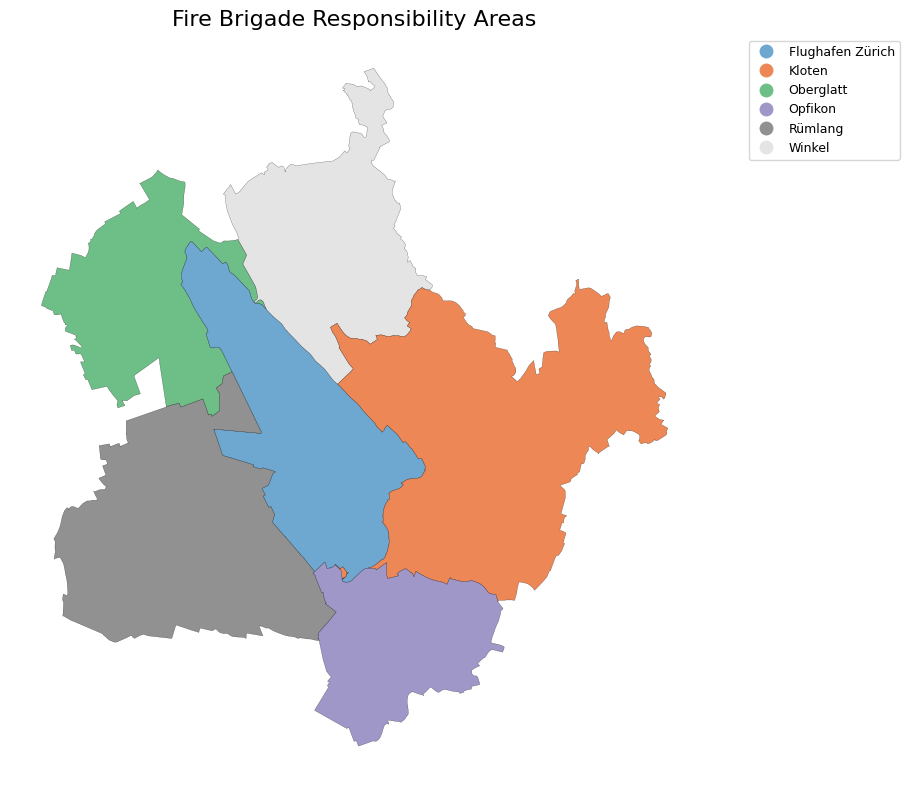


Number of areas per category:
GEMEINDENAME
Oberglatt           1
Flughafen Zürich    1
Winkel              1
Rümlang             1
Kloten              1
Opfikon             1
Name: count, dtype: int64


In [129]:
# Plot the ground cover data
fig, ax = plt.subplots(figsize=(10, 8))

airport_data.plot(
    ax=ax,
    column='GEMEINDENAME',        # colour by category
    categorical=True,        
    legend=True,
    legend_kwds={'bbox_to_anchor': (1.3, 1), 'fontsize': 9},
    cmap='tab20c',            
    edgecolor='black',
    linewidth=0.2,
    alpha=0.7
)

ax.set_title("Fire Brigade Responsibility Areas", fontsize=16)
ax.set_axis_off()

plt.tight_layout()
plt.show()

# Show number of areas per category
print("\nNumber of areas per category:")
print(airport_data['GEMEINDENAME'].value_counts())

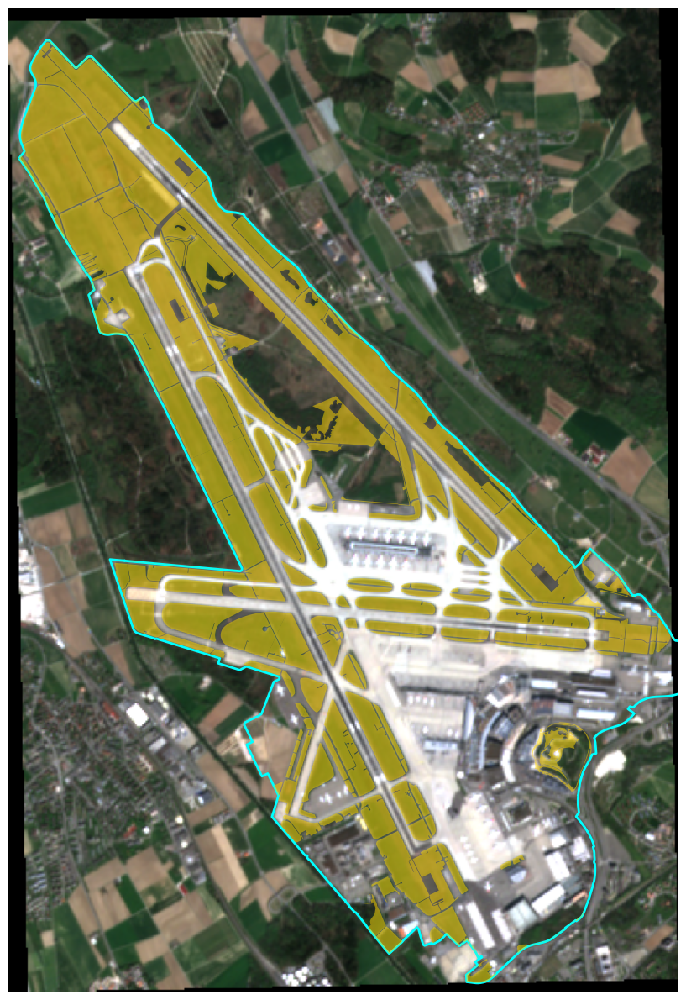

In [ ]:
# Visualize RGB composite with airport polygon overlay

# Filter the data to get only the 'Flughafen Zürich' polygon
aoi_polygon = airport_data[airport_data['GEMEINDENAME'] == 'Flughafen Zürich']

# Intersection to only keep grass areas within the airport boundary
study_area_grass = gpd.overlay(
    aoi_polygon,
    av_grass[['geometry']],
    how='intersection',
    keep_geom_type=True
    )


# Open the raster and create a virtual reprojection to EPSG:2056
with rasterio.open(example_tif) as src:
    with WarpedVRT(src, crs='EPSG:2056', resampling=Resampling.bilinear) as vrt:
        
        # Read RGB bands (Sentinel-2: Band 3=Red, 2=Green, 1=Blue)
        rgb = vrt.read([3, 2, 1]).astype(float)
        
        # Helper function for normalization
        def normalize(array):
            array_min, array_max = np.percentile(array, (2, 98))
            return np.clip((array - array_min) / (array_max - array_min), 0, 1)

        # Normalize the RGB bands
        rgb_norm = np.stack([normalize(band) for band in rgb])

        # Plotting
        fig, ax = plt.subplots(figsize=(12, 12))

        # Show the normalized RGB image
        show(rgb_norm, transform=vrt.transform, ax=ax)

        # Overlay the Polygons
        # Boundary  of the airport area
        aoi_polygon.plot(
            ax=ax,
            facecolor="none",
            edgecolor="cyan",
            linewidth=2,
            zorder=2,
            label='Airport Boundary'
        )
        
        # explicit study area (grass area inside airport zone) 
        study_area_grass.plot(
            ax=ax,
            facecolor="gold",
            alpha=0.5,
            zorder=3,
            label='Grass Areas within Airport'
        )
        # Zoom and Layout with Bounds Check
        # Get desired bounds from polygon + buffer
        minx, miny, maxx, maxy = aoi_polygon.total_bounds
        buffer = 200
        
        target_minx = minx - buffer
        target_maxx = maxx + buffer
        target_miny = miny - buffer
        target_maxy = maxy + buffer

        # Get actual bounds of the satellite image (VRT)
        img_minx, img_miny, img_maxx, img_maxy = vrt.bounds

        # Clamp the plot limits:
        # Take the LARGER of the minimums (to not go left/below image)
        # Take the SMALLER of the maximums (to not go right/above image)
        final_minx = max(target_minx, img_minx)
        final_maxx = min(target_maxx, img_maxx)
        final_miny = max(target_miny, img_miny)
        final_maxy = min(target_maxy, img_maxy)

        ax.set_xlim(final_minx, final_maxx)
        ax.set_ylim(final_miny, final_maxy)


        # Layout adjustments
        # ax.set_title("True Color (RGB) Satellite Image with Airport Overlay", fontsize=14)
        ax.set_axis_off()
        plt.savefig(f"{docs_image_folder}study_area.png", dpi=300, bbox_inches='tight')
        plt.tight_layout()
        plt.show()